### **<font color='blue'> Stable Colorizer </font>**

In [ ]:
import torch
import collections

# Fix Python 3.12
collections.Sized = collections.abc.Sized
collections.Iterable = collections.abc.Iterable
collections.Mapping = collections.abc.Mapping
collections.MutableMapping = collections.abc.MutableMapping
collections.Sequence = collections.abc.Sequence
collections.MutableSequence = collections.abc.MutableSequence

# Fix PyTorch 2.6 (Tanpa Recursion)
if not hasattr(torch, '_original_load'):
    torch._original_load = torch.load

def patched_load(*args, **kwargs):
    kwargs['weights_only'] = False
    return torch._original_load(*args, **kwargs)

torch.load = patched_load

# Buat folder hasil biar tidak error 'FileNotFound'
!mkdir -p result_images


✅ Jamu Berhasil! Sekarang jalankan cell Colorizer.


#◢ DeOldify - Colorize your own photos!

####**Credits:**

Special thanks to:

Matt Robinson and María Benavente for pioneering the DeOldify image colab notebook.  

Dana Kelley for doing things, breaking stuff & having an opinion on everything.



---


#◢ Verify Correct Runtime Settings

**<font color='#FF000'> IMPORTANT </font>**

In the "Runtime" menu for the notebook window, select "Change runtime type." Ensure that the following are selected:
* Runtime Type = Python 3
* Hardware Accelerator = GPU


#◢ Git clone and install DeOldify

In [ ]:
!git clone https://github.com/jantic/DeOldify.git DeOldify

fatal: destination path 'DeOldify' already exists and is not an empty directory.


In [ ]:
cd DeOldify

/content/DeOldify


#◢ Setup

In [ ]:
#NOTE:  This must be the first call in order to work properly!
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

In [ ]:
!pip install -r requirements-colab.txt deoldify

In [ ]:
import fastai
from deoldify.visualize import *

torch.backends.cudnn.benchmark = True

INFO:numexpr.utils:NumExpr defaulting to 2 threads.


NumExpr defaulting to 2 threads.


/content/DeOldify/fastai/gen_doc/gen_notebooks.py:63: SyntaxWarning: invalid escape sequence '\s'
  match = re.match(f"^({key})\s*=\s*.*", codestr)
/content/DeOldify/fastai/gen_doc/gen_notebooks.py:216: SyntaxWarning: invalid escape sequence '\('
  if re.search(f"update_nb_metadata\('{fn}'", c['source']): return c
/content/DeOldify/fastai/gen_doc/nbdoc.py:26: SyntaxWarning: invalid escape sequence '\*'
  arg_prefixes = {inspect._VAR_POSITIONAL: '\*', inspect._VAR_KEYWORD:'\*\*'}
/content/DeOldify/fastai/gen_doc/nbdoc.py:26: SyntaxWarning: invalid escape sequence '\*'
  arg_prefixes = {inspect._VAR_POSITIONAL: '\*', inspect._VAR_KEYWORD:'\*\*'}
/content/DeOldify/fastai/gen_doc/nbdoc.py:56: SyntaxWarning: invalid escape sequence '\['
  return f'`Optional`\[{type_repr(args[0])}\]'
/content/DeOldify/fastai/gen_doc/nbdoc.py:56: SyntaxWarning: invalid escape sequence '\]'
  return f'`Optional`\[{type_repr(args[0])}\]'
/content/DeOldify/fastai/gen_doc/nbdoc.py:58: SyntaxWarning: invalid escap

In [ ]:
!mkdir 'models'
!wget https://www.dropbox.com/s/axsd2g85uyixaho/ColorizeStable_gen.pth?dl=0 -O ./models/ColorizeStable_gen.pth

mkdir: cannot create directory ‘models’: File exists
--2026-05-04 23:10:17--  https://www.dropbox.com/s/axsd2g85uyixaho/ColorizeStable_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/lqpj4methnbmgjd9wlqto/ColorizeStable_gen.pth?rlkey=sj7d54400lq8898wf3s2higco&dl=0 [following]
--2026-05-04 23:10:18--  https://www.dropbox.com/scl/fi/lqpj4methnbmgjd9wlqto/ColorizeStable_gen.pth?rlkey=sj7d54400lq8898wf3s2higco&dl=0
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8a4e32466d144adba779375a97.dl.dropboxusercontent.com/cd/0/inline/C_2dDrGc_NFLFURBuJKdniC8VbfVcqQV0m_7XXPIzh6ocOlVYK0cUq-jJ5tBMquXq9JK_jO9bWWPZJNvEx6Og3RtDs-wSxabcYMrgrX5lKeSKRyeHKae1PyK2YUVv_glnCJbH5BBdYTiAJrlMzKzQtVX/file# [following]
--2

In [ ]:
import torch
import collections

# 1. Fix untuk Python 3.12 (Masalah Collections)
collections.Sized = collections.abc.Sized
collections.Iterable = collections.abc.Iterable
collections.Mapping = collections.abc.Mapping
collections.MutableMapping = collections.abc.MutableMapping
collections.Sequence = collections.abc.Sequence
collections.MutableSequence = collections.abc.MutableSequence

# 2. Fix untuk PyTorch 2.6 (Bypass Keamanan secara Aman)
# Simpan fungsi load yang asli dulu agar tidak terjadi recursion error
if not hasattr(torch, '_original_load'):
    torch._original_load = torch.load

# Paksa agar 'weights_only' selalu False saat memuat model
def safe_load(*args, **kwargs):
    kwargs['weights_only'] = False
    return torch._original_load(*args, **kwargs)

torch.load = safe_load

# 3. Pastikan folder penyimpanan ada
!mkdir -p test_images result_images

In [ ]:
# Allow necessary classes for DeOldify (PyTorch 2.6+ security requirement)
import torch
import torch.nn as nn
import fastai.basic_train
import fastai.callbacks.hooks

torch.serialization.add_safe_globals([
    getattr,
    fastai.basic_train.Recorder,
    fastai.callbacks.hooks.Hook,
    fastai.callbacks.hooks._hook_inner,
    nn.modules.container.Sequential,
    nn.modules.conv.Conv2d,
    nn.modules.batchnorm.BatchNorm2d,
    nn.modules.activation.ReLU,
    nn.modules.pixelshuffle.PixelShuffle
])

colorizer = get_image_colorizer(artistic=False)

/content/DeOldify/fastai/data_block.py:451: UserWarning: Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.
  warn("Your training set is empty. If this is by design, pass `ignore_empty=True` to remove this warning.")
/content/DeOldify/fastai/data_block.py:453: UserWarning: Your validation set is empty. If this is by design, use `split_none()`
                 or pass `ignore_empty=True` when labelling to remove this warning.
  warn("""Your validation set is empty. If this is by design, use `split_none()`
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  se

Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-63fe2227.pth


100%|██████████| 171M/171M [00:01<00:00, 108MB/s]
/usr/local/lib/python3.12/dist-packages/torch/nn/utils/weight_norm.py:144: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


#◢ Instructions

### source_url
Type in a url to a direct link of an image.  Usually that means they'll end in .png, .jpg, etc. NOTE: If you want to use your own image, upload it first to a site like Imgur.

### render_factor
The default value of 35 has been carefully chosen and should work -ok- for most scenarios (but probably won't be the -best-). This determines resolution at which the color portion of the image is rendered. Lower resolution will render faster, and colors also tend to look more vibrant. Older and lower quality images in particular will generally benefit by lowering the render factor. Higher render factors are often better for higher quality images, but the colors may get slightly washed out.

### watermarked
Selected by default, this places a watermark icon of a palette at the bottom left corner of the image.  This is intended to be a standard way to convey to others viewing the image that it is colorized by AI. We want to help promote this as a standard, especially as the technology continues to improve and the distinction between real and fake becomes harder to discern. This palette watermark practice was initiated and lead by the company MyHeritage in the MyHeritage In Color feature (which uses a newer version of DeOldify than what you're using here).

#### How to Download a Copy
Simply right click on the displayed image and click "Save image as..."!

## Pro Tips

You can evaluate how well the image is rendered at each render_factor by using the code at the bottom (that cell under "See how well render_factor values perform on a frame here").

#◢ Colorize!!

In [ ]:
!mkdir -p test_images result_images
print("Folder berhasil dibuat, Bos!")

Folder berhasil dibuat, Bos!


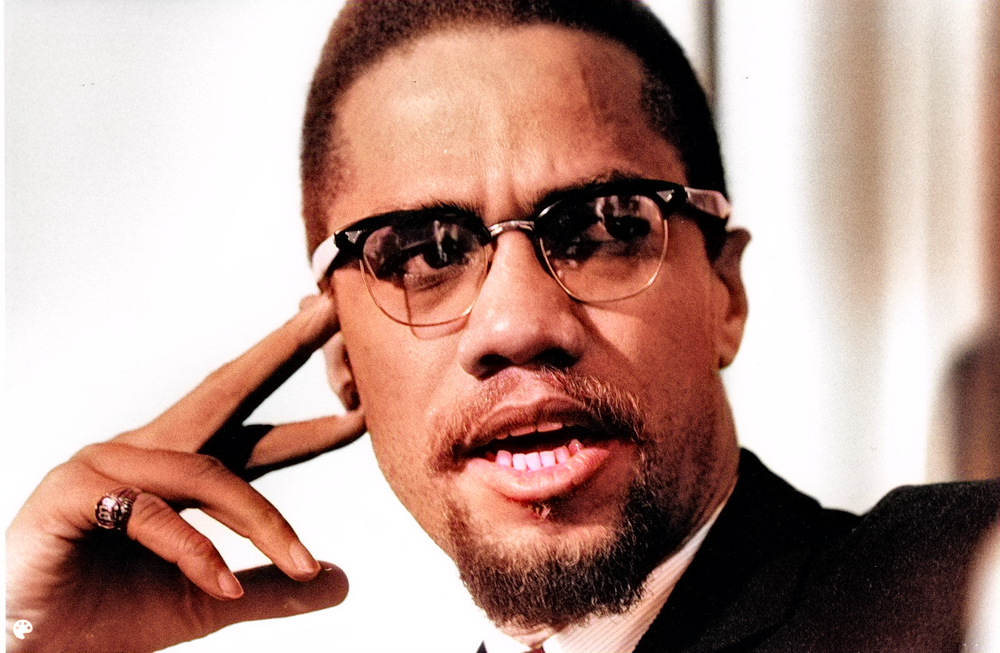

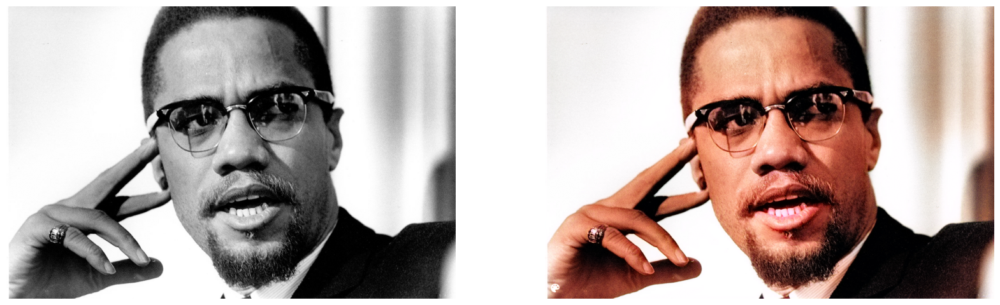

In [ ]:
source_url = 'https://cdn.britannica.com/26/235926-050-119B7E29/Malcolm-X-1965.jpg' #@param {type:"string"}
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = True #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

## See how well render_factor values perform on the image here

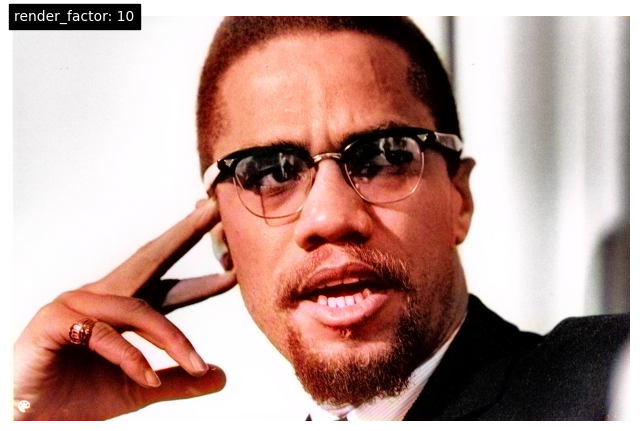

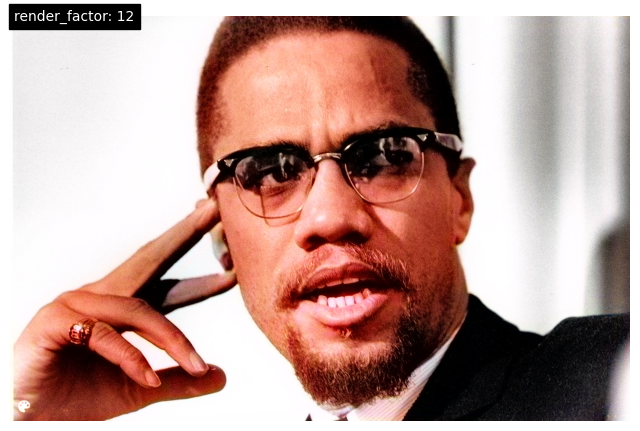

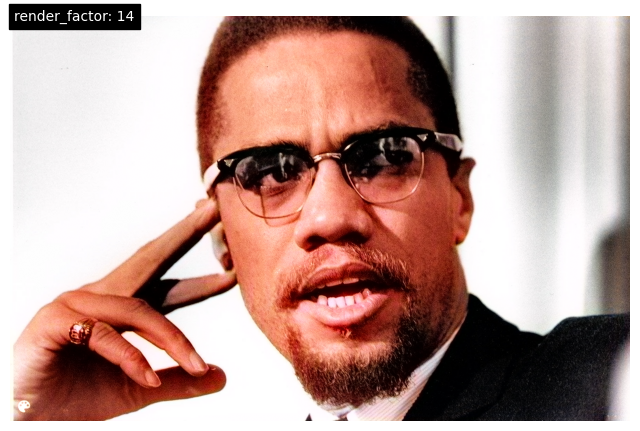

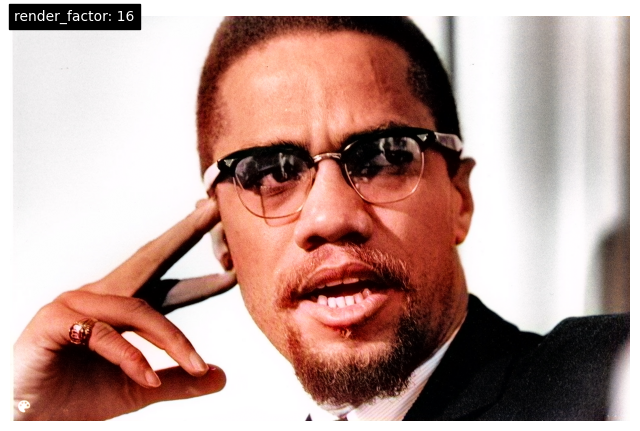

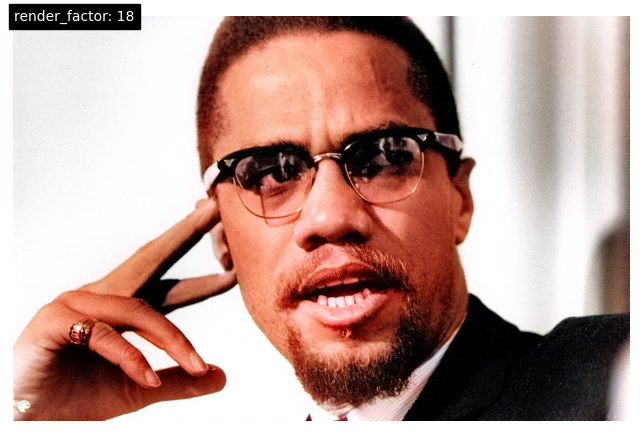

...

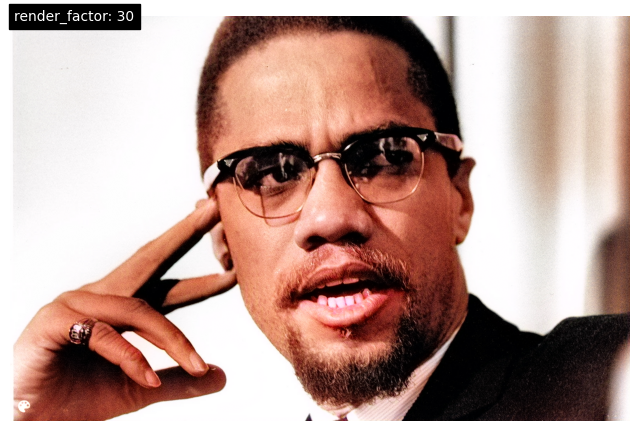

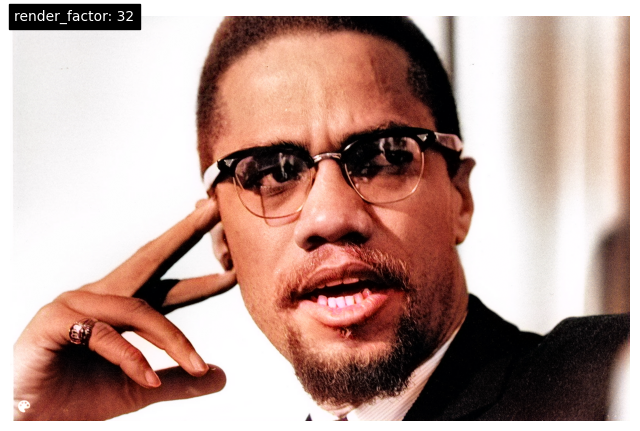

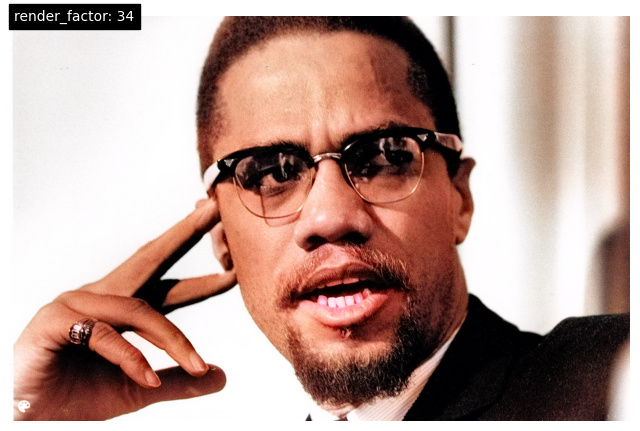

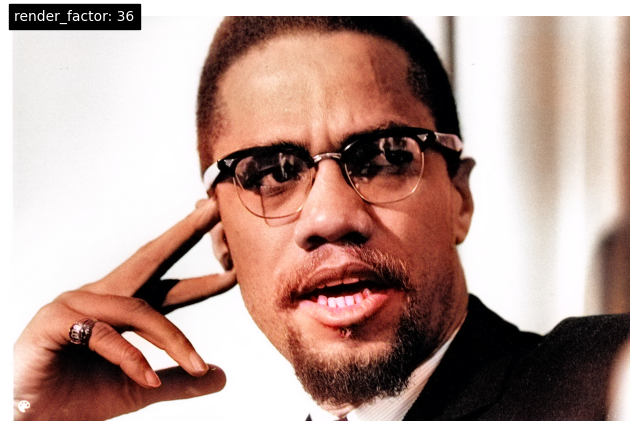

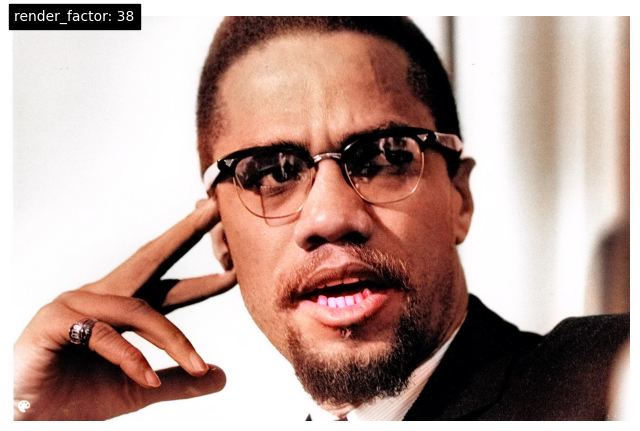

In [ ]:
for i in range(10,40,2):
    colorizer.plot_transformed_image('test_images/image.png', render_factor=i, display_render_factor=True, figsize=(8,8))

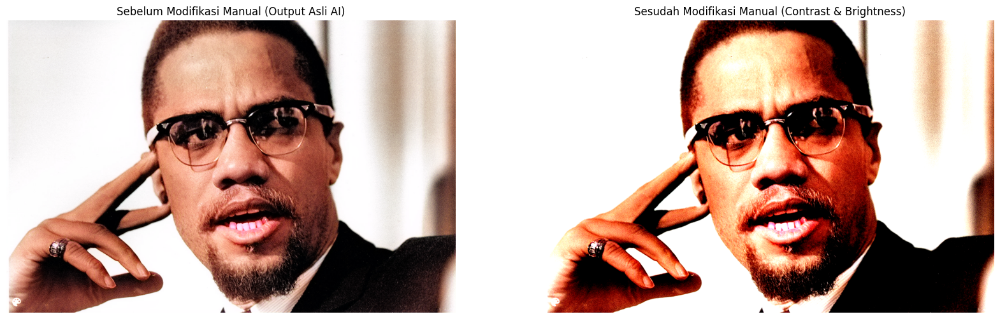

✅ Gambar hasil modifikasi telah disimpan sebagai 'result_modified.png'


In [ ]:
from PIL import Image, ImageEnhance
import matplotlib.pyplot as plt

# 1. Pastikan variabel 'image_path' berisi lokasi file hasil DeOldify
# Biasanya DeOldify menyimpan hasil di 'result_images/image.png'
path_hasil = 'result_images/image.png'

# 2. Buka gambar hasil pewarnaan
img = Image.open(path_hasil)

# 3. EKSPERIMEN: Modifikasi Kontras dan Kecerahan
# Meningkatkan Kontras (1.5 = naik 50%)
enhancer_contrast = ImageEnhance.Contrast(img)
img_modified = enhancer_contrast.enhance(1.5)

# Meningkatkan Kecerahan (1.2 = naik 20%)
enhancer_brightness = ImageEnhance.Brightness(img_modified)
img_modified = enhancer_brightness.enhance(1.2)

# 4. Tampilkan Perbandingan di Notebook
plt.figure(figsize=(20,10))

# Subplot 1: Sebelum Modifikasi Manual
plt.subplot(1, 2, 1)
plt.title("Sebelum Modifikasi Manual (Output Asli AI)")
plt.imshow(img)
plt.axis('off')

# Subplot 2: Sesudah Modifikasi Manual
plt.subplot(1, 2, 2)
plt.title("Sesudah Modifikasi Manual (Contrast & Brightness)")
plt.imshow(img_modified)
plt.axis('off')

plt.show()

# 5. Simpan hasil modifikasi untuk laporan
img_modified.save("result_modified.png")
print("✅ Gambar hasil modifikasi telah disimpan sebagai 'result_modified.png'")

---
#⚙ Recommended image sources
* [/r/TheWayWeWere](https://www.reddit.com/r/TheWayWeWere/)